In [1]:
import numpy as np
from matplotlib import pyplot as plt
from scipy.io.wavfile import write as wavwrite
from scipy.io.wavfile import read as wavread
from scipy.fft import fft,fftfreq,rfft,rfftfreq,irfft
import time
from time import sleep
from IPython.display import Audio
from scipy import signal
import cv2 as cv
from matplotlib.pylab import cm

#default values 
duration = 1 #seconds
sample_rate = 44100 # samples per second
base = "D:/ENTC/PROJECTS/signal-processing/sp_files/"


#unique file name generator
def unique_file_name(additional_name=""):
    return str(time.time()) + ("_" + additional_name if additional_name else "") 

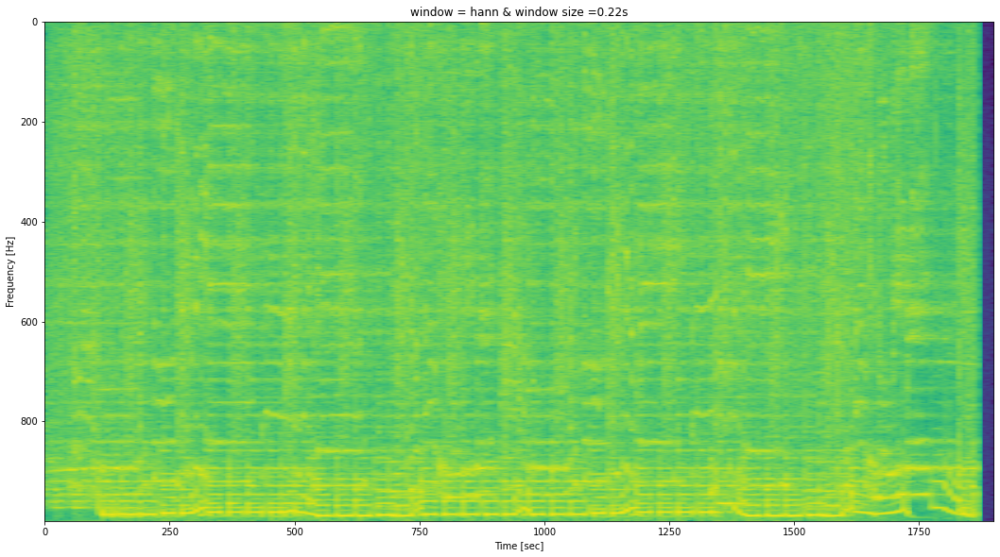

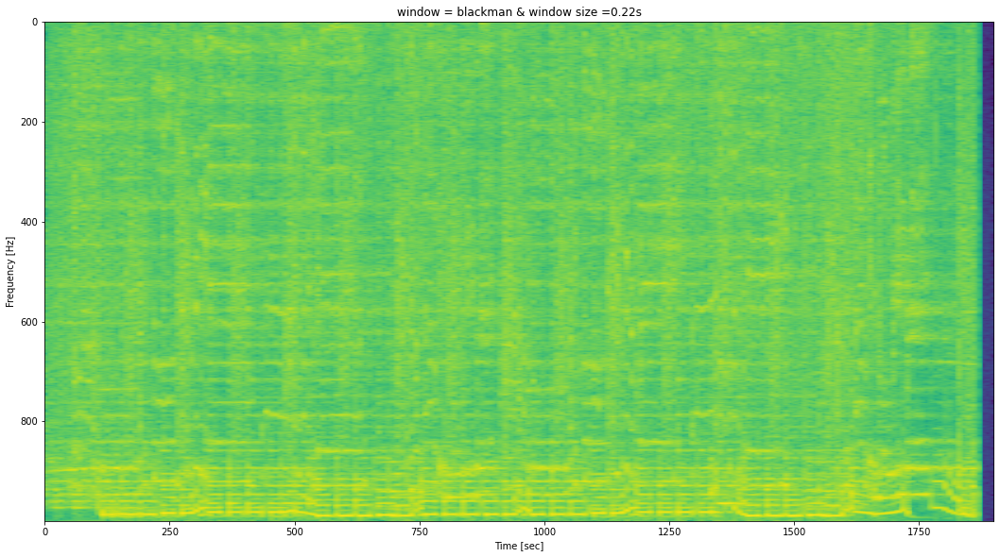

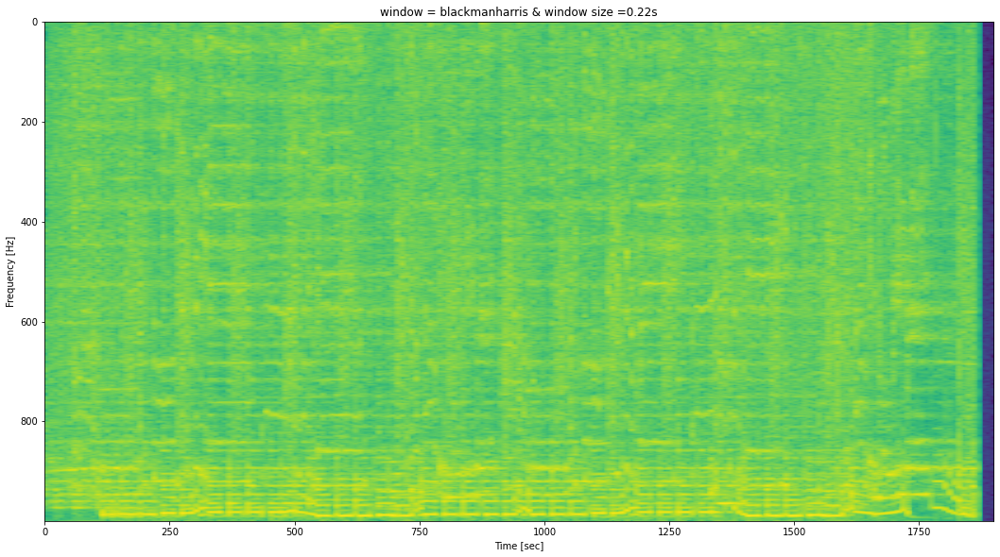

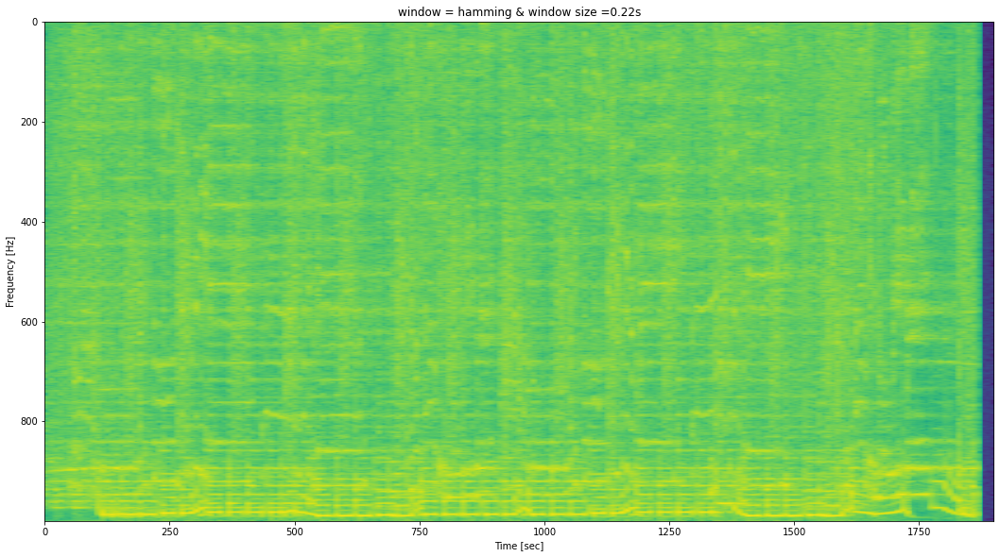

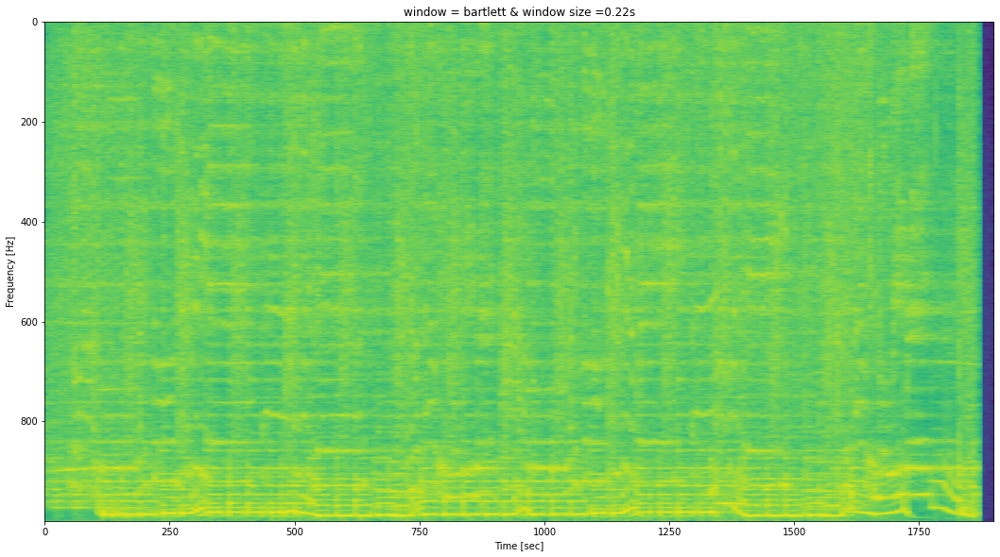

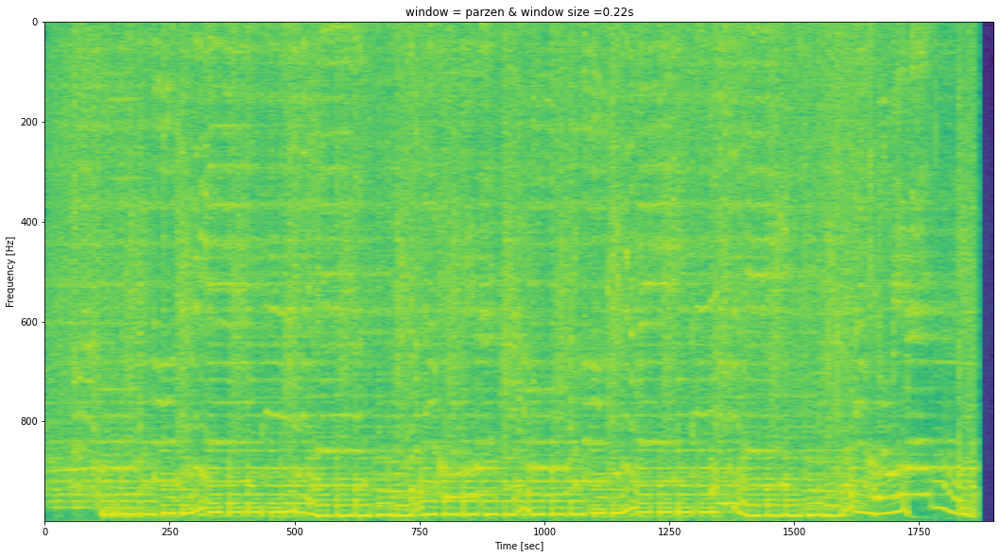

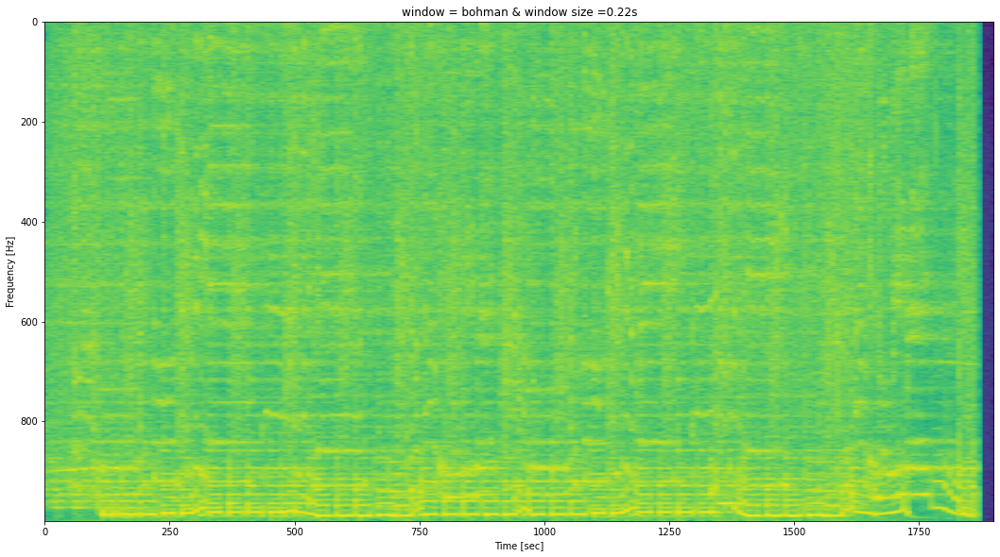

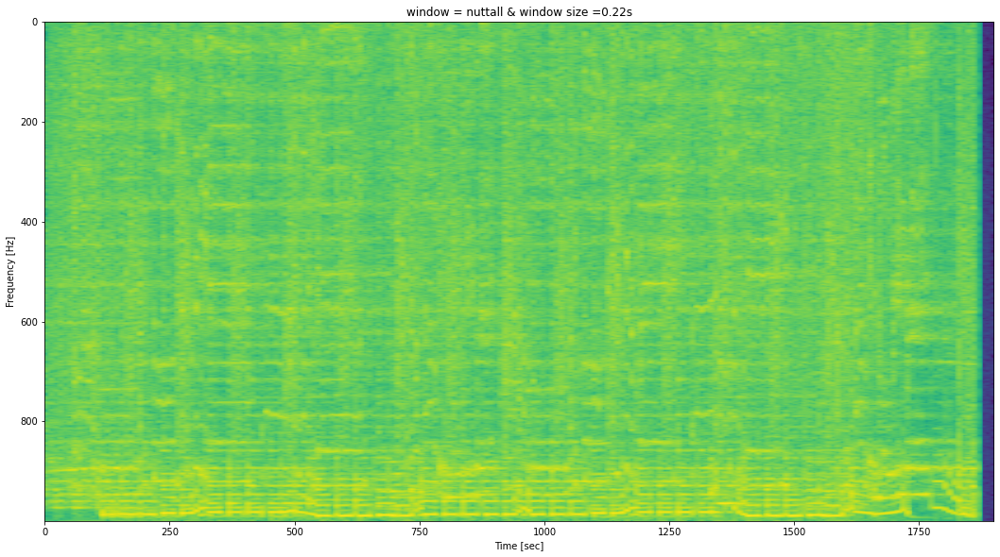

In [2]:
windows_set = ["hann","blackman","blackmanharris","hamming","bartlett","parzen","bohman","nuttall"]

filename = base + 'no-regrets.wav'
#filename = base + 'notes-14.wav'


sample_rate, samples = wavread(filename)

samples =  np.average(samples,axis=1)
        
for window in windows_set:
#     break
    for i in [0.09,0.11,0.14,0.19,0.22,0.29,0.32,0.39,0.43,0.5][4:5]:
        #break
        #sleep(0.3)


        frequencies, times, spectrogram = signal.stft(samples,sample_rate,window=window,nperseg=int(sample_rate*i))
        spectrogram = np.abs(spectrogram)
        #spectrogram = cv.equalizeHist(spectrogram.astype(np.uint8))
        spectrogram = np.flip(spectrogram,axis=0)

        spectrogram = cv.resize(spectrogram,(1900,5000))#[spectrogram.shape[0]//2:,:]
        
        spectrogram = np.log(spectrogram[-1000:,:])
        
        
        #plt.pcolormesh(times, frequencies, spectrogram)
        #commenting pot functions
        fig,ax = plt.subplots(1,1,figsize=(18,18))
        ax.imshow(spectrogram)
        plt.ylabel('Frequency [Hz]')
        plt.xlabel('Time [sec]')
        plt.title(f"window = {window} & window size ={i}s")
        plt.show()



        

Audio(filename,autoplay=0)

<IPython.core.display.Javascript object>


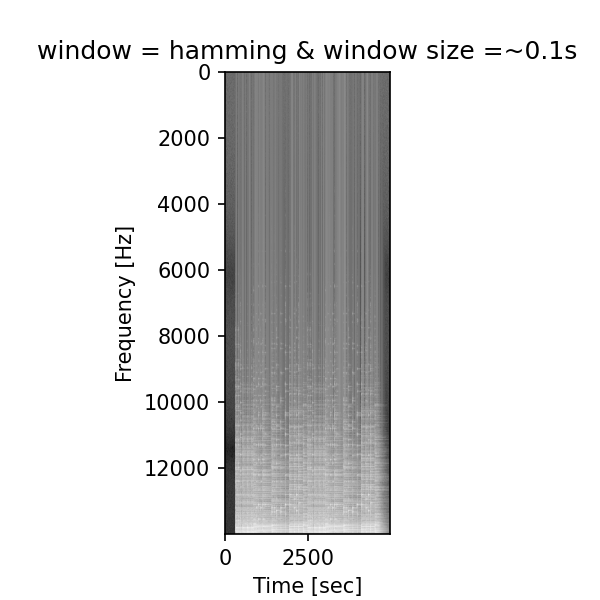

In [3]:
%matplotlib nbagg
filename = base + 'no-regrets.wav'
filename = base + 'notes-17.wav'
# filename = base + "notes-9.wav"

sample_rate, samples = wavread(filename)

samples =  np.average(samples,axis=1)

window,i,tresh1 = "hamming",0.1,0.1


frequencies, times, spectrogram = signal.stft(samples,sample_rate,window=window,nperseg=2**int(np.log2(sample_rate*i)))
spectrogram = np.abs(spectrogram)
#spectrogram = cv.equalizeHist(spectrogram.astype(np.uint8))
spectrogram = np.flip(spectrogram,axis=0)

spectrogram = cv.resize(spectrogram,(5000,14_000))#[spectrogram.shape[0]//2:,:]
limit = 0 #-4000
spectrogram = np.log(spectrogram[limit:,:])


#plt.pcolormesh(times, frequencies, spectrogram)
#commenting pot functions
fig,ax = plt.subplots(1,1,figsize=(4,4))
ax.imshow(spectrogram,cmap="gray")
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.title(f"window = {window} & window size =~{i}s")
plt.show()


<IPython.core.display.Javascript object>


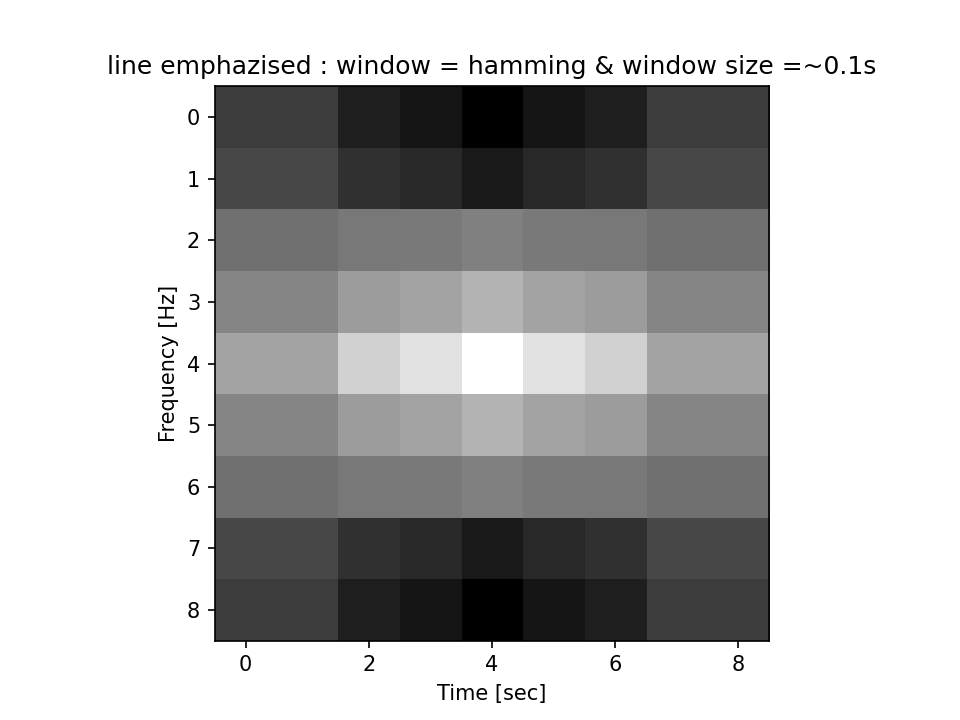

<IPython.core.display.Javascript object>


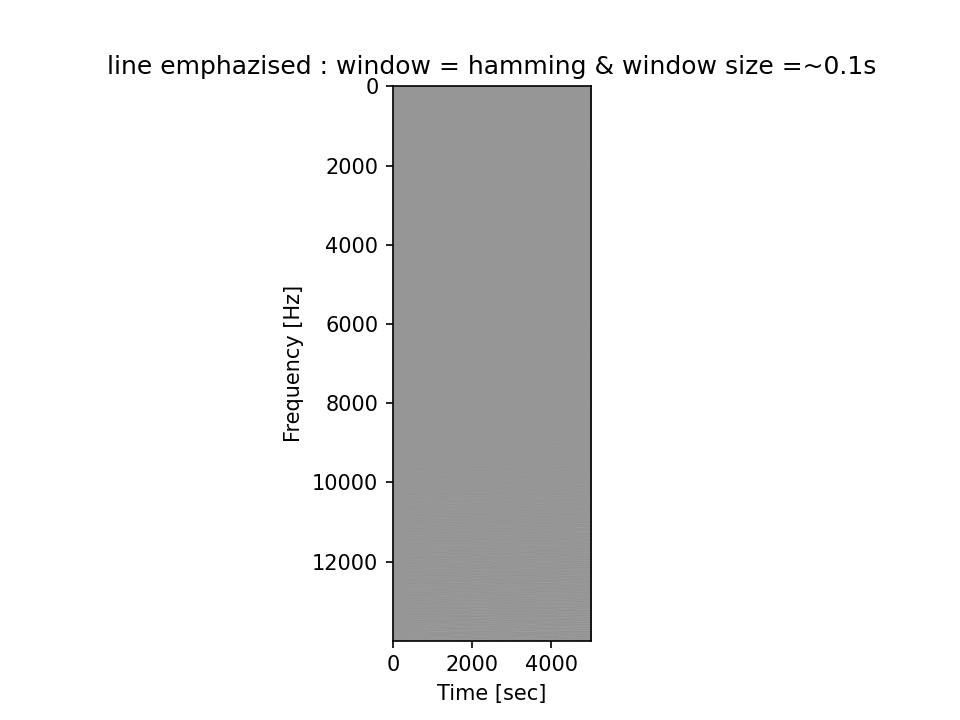

In [4]:
#assume a 9x9 kernel <== line wdth (vertical) ~= 5 pixels
ksize=9
line_filter_kernel = np.array([[-4]*ksize,
                               [-3]*ksize,
                               [+1]*ksize,
                               [+3]*ksize,
                               [+6]*ksize,
                               [+3]*ksize,
                               [+1]*ksize,
                               [-3]*ksize,
                               [-4]*ksize],dtype=np.float32)
line_filter_kernel *= np.array([[0.4,0.4,0.7,0.8,1,0.8,0.7,0.4,0.4]])



fig,ax = plt.subplots(1,1)
ax.imshow(line_filter_kernel,cmap="gray")
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.title(f"line emphazised : window = {window} & window size =~{i}s")
plt.show()

line_extracted = cv.filter2D(spectrogram,-1,line_filter_kernel)

fig,ax = plt.subplots(1,1)
ax.imshow(line_extracted,cmap="gray")
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.title(f"line emphazised : window = {window} & window size =~{i}s")
plt.show()

<IPython.core.display.Javascript object>


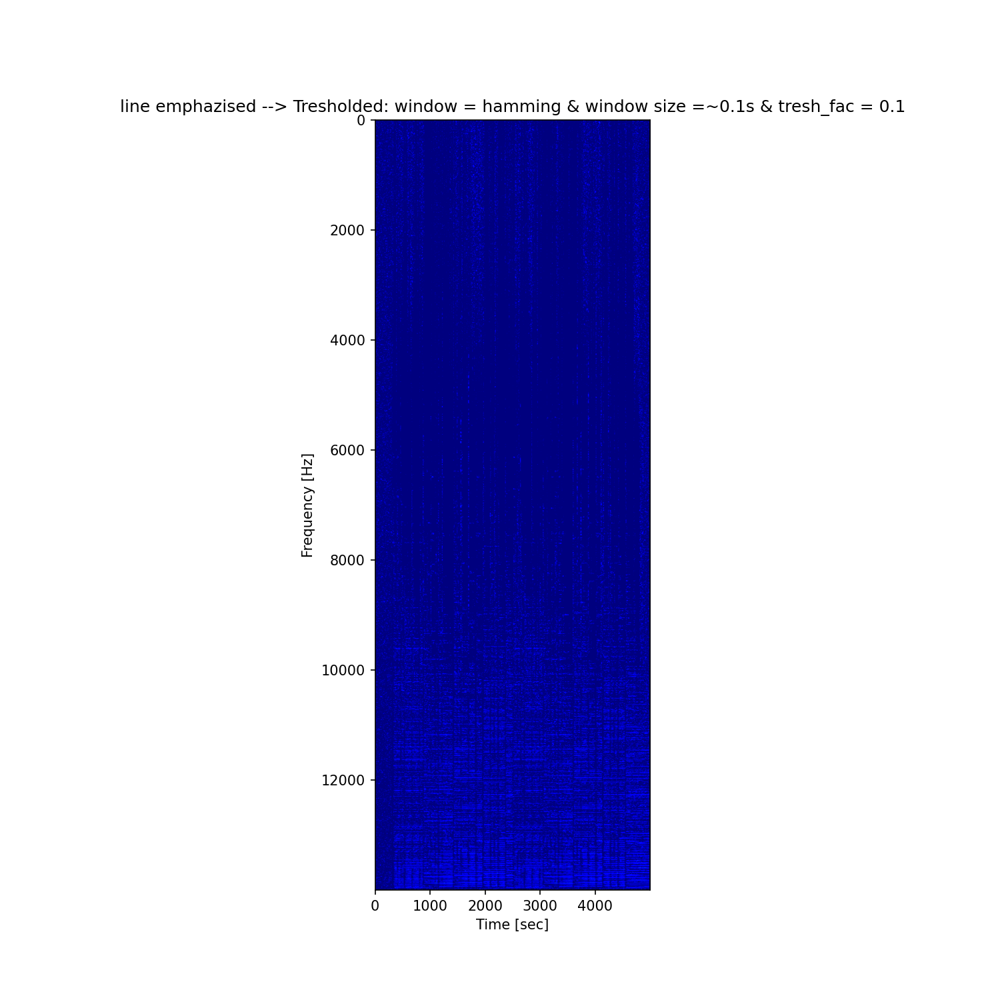

In [5]:
tresh_fact1  = 0.1
line_extracted_tresholded = line_extracted * np.float32((line_extracted>tresh_fact1*line_extracted.max()))

fig,ax = plt.subplots(1,1,figsize=(10,10))
ax.imshow(line_extracted_tresholded,cmap="jet")
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.title(f"line emphazised --> Tresholded: window = {window} & window size =~{i}s & tresh_fac = {tresh_fact1}")
plt.show()


In [6]:
Audio(filename=filename,autoplay=1)